In [26]:
# Installs
!pip3 install matplotlib
!pip3 install numpy
!pip3 install librosa
!pip3 install wavio


DEPRECATION: Configuring installation scheme with distutils config files is deprecated and will no longer work in the near future. If you are using a Homebrew or Linuxbrew Python, please see discussion at https://github.com/Homebrew/homebrew-core/issues/76621
DEPRECATION: Configuring installation scheme with distutils config files is deprecated and will no longer work in the near future. If you are using a Homebrew or Linuxbrew Python, please see discussion at https://github.com/Homebrew/homebrew-core/issues/76621
DEPRECATION: Configuring installation scheme with distutils config files is deprecated and will no longer work in the near future. If you are using a Homebrew or Linuxbrew Python, please see discussion at https://github.com/Homebrew/homebrew-core/issues/76621
DEPRECATION: Configuring installation scheme with distutils config files is deprecated and will no longer work in the near future. If you are using a Homebrew or Linuxbrew Python, please see discussion at https://github.

In [35]:
# Imports
import matplotlib.pyplot as plt
import numpy as np
import IPython.display as ipd
import soundfile as sf

# Question 1

For my DAWless set-up I connected my MIDI controller Akai MPK mini to my Yamaha P-95 keyboard. This required a midi cable so that the Akai mini could transmit signals to the Yamaha which recieved them. The Yamaha keyboard is a pretty basic 88-key piano, whereas the Akai mini only has a span of 2 octaves (although you can shift the range with the octave up/down buttons). The latency was actually pretty fine from the mini to the P-95, although there was a slight delay compared to just playing the notes on the keyboard. I'm sure this latency might become more apparent if the hardware was more complex/had more effects on it, or I was trying to use a much longer cable between the two.

# Question 2

### Figures

As we learned in class, multiplying by j is the equivalent of rotating a vector by 90 degrees counter-clockwise (while maintaining it's current magnitude). So in a figure it would look like:


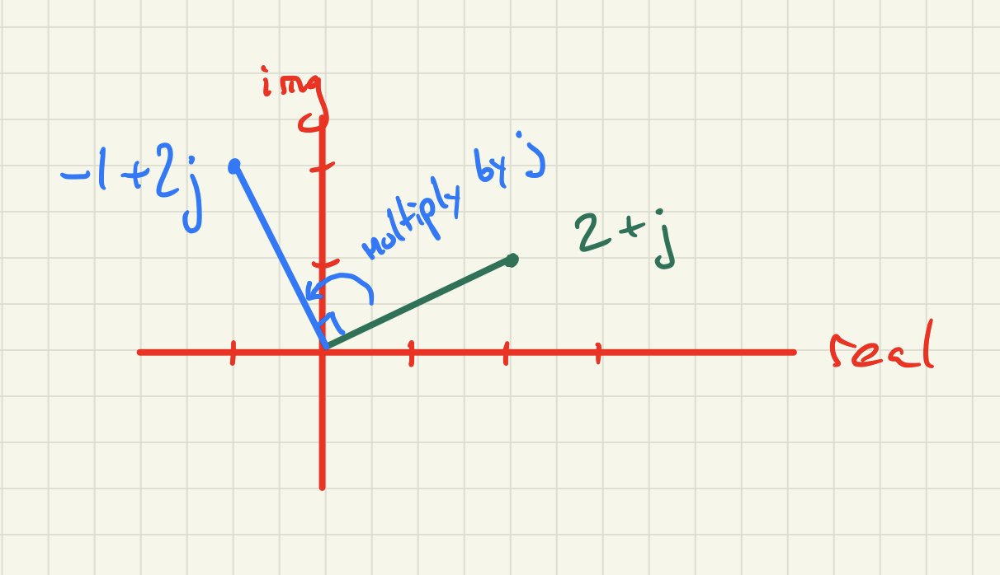

In [3]:
from IPython import display
display.Image("q2_figure.jpeg")

### Math

The formula for complex number multiplication is: (a + bi) * (c + di) = (ac - bd) + (ad + bc)j. Therefore we can sub in the values to get (2 + 1j) * (0 + 1j) = (2\*0 - 1\*1) + (2\*1 + 1\*0)j = -1 + 2j

Also using the identity j^2 = -1 then we can get (2+j) * j = 2j + j^2 = -1 + 2j as well

### Code

See the coded version of multiplying complex numbers below:

In [4]:
# Question 2

def print_complex(arr):
    print(f"{arr[0]} + {arr[1]}j")

arr1 = (2, 1)
arr2 = (0, 1)

real_part = arr1[0]*arr2[0] - arr1[1]*arr2[1]
img_part = arr1[0]*arr2[1] + arr1[1]*arr2[0]

res = (real_part, img_part)
print_complex(res)  # Output: (-2, 22)

-1 + 2j


# Question 3

For this question I connected my MPK mini pro 2 to my Macbook Pro via a usb-midi cable and used the DAW logic pro to play music with it. I would say that this was easier to visualize whether the connection happened compared to the double hardware question and it was fun trying out different instruments within Logic Pro. I like to compose music for piano and voice, and have used Logic for recording and mixing/mastering but would like to explore making more music electronically as well!

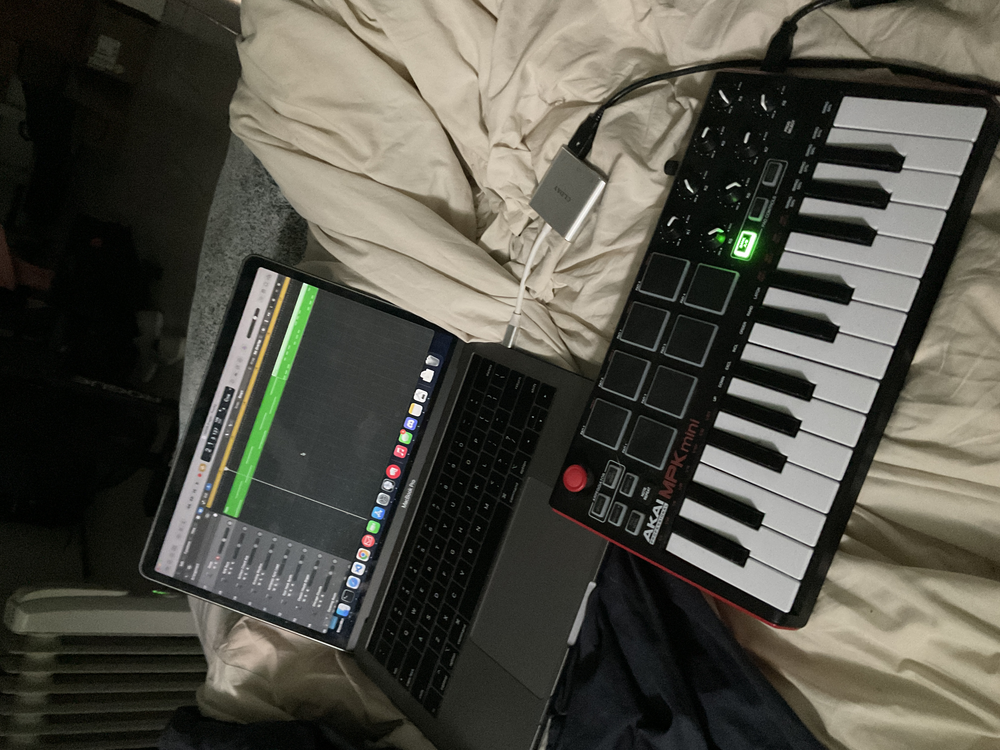

In [43]:
from IPython import display
display.Image("q3_photo.JPG")

# Question 4

By knowing the frequency and phase of the random-amplitude sign waves we are able to estimate each of their amplitudes by multiplying the combined mixture of the three with each of the corresponding basis sine waves. This creates a projection of that frequency where it is then possible to measure its specific magnitude.

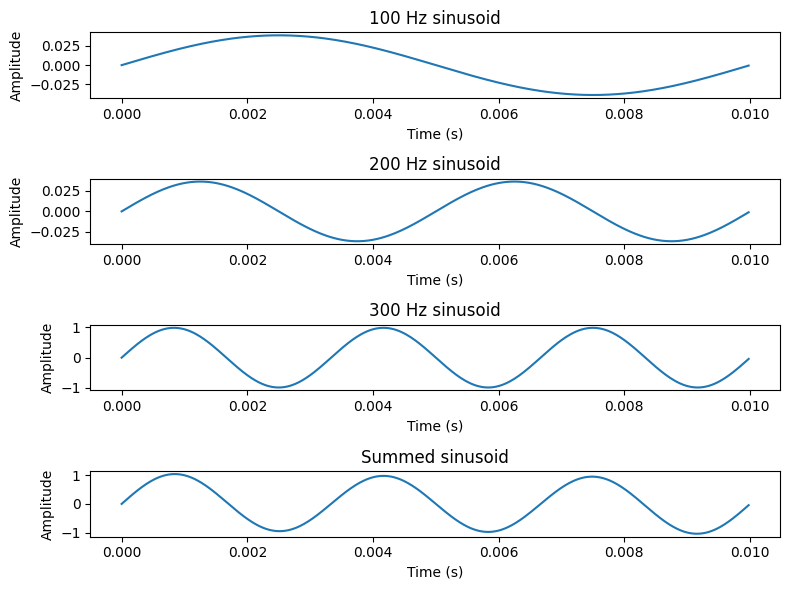

Estimated amplitudes:  [0.03862831 0.03626328 0.98357157]
Actual amplitudes:  [0.03862918 0.0362641  0.98359388]


In [46]:
# Question 4

srate = 44100
dur = 1  
freqs = [100, 200, 300]  
amps = np.random.random(3)

t = np.linspace(0, dur, int(srate*dur))
sinusoids = [amp*np.sin(2*np.pi*freq*t) for freq, amp in zip(freqs, amps)]

audio = np.sum(sinusoids, axis=0)

fig, axs = plt.subplots(4, 1, figsize=(8, 6))
for i in range(3):
    axs[i].plot(t[:int(srate/freqs[0])], sinusoids[i][:int(srate/freqs[0])])
    axs[i].set_xlabel('Time (s)')
    axs[i].set_ylabel('Amplitude')
    axs[i].set_title(f'{freqs[i]} Hz sinusoid')
axs[3].plot(t[:int(srate/freqs[0])], audio[:int(srate/freqs[0])])
axs[3].set_xlabel('Time (s)')
axs[3].set_ylabel('Amplitude')
axs[3].set_title('Summed sinusoid')
plt.tight_layout()
plt.show()

basis_sin = [np.sin(2*np.pi*freq*t) for freq in freqs]
est_amps = np.abs(np.dot(basis_sin, audio))/len(audio)*2

print('Estimated amplitudes: ', est_amps)
print('Actual amplitudes: ', amps)

ipd.Audio(audio, rate=srate)

# Question 5

When the frequency is known but both the phase and amplitudes are unknown then there are two main ways for estimating the amplitude. You can use the brute force approach shown first, where you shift the basis sine wave's phase for an entire period and take the maximum amplitude at that phase shift (and you can make this estimation more accurate but also more computationally intensive by increasing the amount of phase shifts making them smaller, here I chose 360 as a nice number for going around a circle). The other method is using the dot product of the sin and cos waves to determine the estimated amplitudes and relative phase. It is IMPORTANT to notice that the arctan(b/a) only shows the relative phase shift hence why I took the modulo of pi of the original, random phase shift and the estimated phase shift from the dot product.

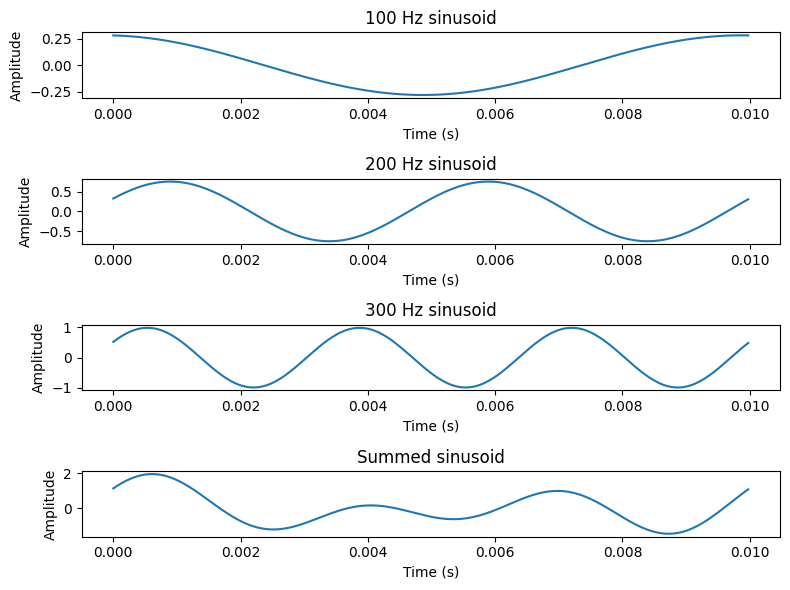

BRUTE FORCE:
Estimated amplitudes:  [0.2829963279714266, 0.7594622442195884, 0.9891176612057428]
Actual amplitudes:  [0.28295787 0.75948436 0.98911432]
Estimated phases:  [1.6626813486965477, 0.45504963227484463, 0.5600610858767319]
Actual phases:  [1.65599215 0.44654034 0.5582896 ]

DOT PROD:
Estimated amplitudes:  [0.2830026887825759, 0.7594893473714036, 0.9891191369145907]
Actual amplitudes:  [0.28295787 0.75948436 0.98911432]
Estimated relative phases:  [1.655976688356773, 0.4466014097449749, 0.5583336931401468]
Actual relative phases:  [1.65599215 0.44654034 0.5582896 ]


In [51]:
# Question 5

srate = 44100
dur = 1  
freqs = [100, 200, 300]  
amps = np.random.random(3)
phases = np.random.uniform(low=0, high=2*np.pi, size=3)

t = np.linspace(0, dur, int(srate*dur))
sinusoids = [amp*np.sin(2*np.pi*freq*t + phase) for freq, amp, phase in zip(freqs, amps, phases)]

audio = np.sum(sinusoids, axis=0)

fig, axs = plt.subplots(4, 1, figsize=(8, 6))
for i in range(3):
    axs[i].plot(t[:int(srate/freqs[0])], sinusoids[i][:int(srate/freqs[0])])
    axs[i].set_xlabel('Time (s)')
    axs[i].set_ylabel('Amplitude')
    axs[i].set_title(f'{freqs[i]} Hz sinusoid')
axs[3].plot(t[:int(srate/freqs[0])], audio[:int(srate/freqs[0])])
axs[3].set_xlabel('Time (s)')
axs[3].set_ylabel('Amplitude')
axs[3].set_title('Summed sinusoid')
plt.tight_layout()
plt.show()

# Brute force method to estimate amplitudes and phases
est_amps = []
est_phases = []
for freq in freqs:
    best_dot = -np.inf
    best_phase = 0
    for phase in np.linspace(0, 2 * np.pi, 360):
        basis_sinusoid = np.sin(2 * np.pi * freq * t + phase)
        dot = np.dot(audio, basis_sinusoid)
        if dot > best_dot:
            best_dot = dot
            best_phase = phase
    est_amps.append(best_dot/srate*2)
    est_phases.append(best_phase)

print('BRUTE FORCE:')
print('Estimated amplitudes: ', est_amps)
print('Actual amplitudes: ', amps)
print('Estimated phases: ', est_phases)
print('Actual phases: ', phases)

# b) Sin/cos dot product method to estimate amplitudes and phases
est_amps = []
est_relative_phases = []
for freq in freqs:
    basis_sin = np.sin(2 * np.pi * freq * t)
    basis_cos = np.sin(2 * np.pi * freq * t + np.pi/2)
    a = np.dot(audio, basis_sin)
    b = np.dot(audio, basis_cos)
    est_amps.append(np.sqrt(a**2+b**2)/srate*2)
    est_relative_phases.append(np.arctan(b/a)%(np.pi))

relative_phases = phases%(np.pi)
print('\nDOT PROD:')
print('Estimated amplitudes: ', est_amps)
print('Actual amplitudes: ', amps)
print('Estimated relative phases: ', est_relative_phases)
print('Actual relative phases: ', relative_phases)

ipd.Audio(audio, rate=srate)

# Question 6

Arpeggiators will continuously play the notes currently pressed down in a chosen pattern at a chosen tempo. To emulate this in Python I created a midi to frequency converter as well as an option for how many times the pattern of notes would arpeggiate (the 'repeats' variable). Some things I didn't have time to sort out was to make the repeats occur in the 'random' mode be unique from one another, but if this was sending midi messages instead in buffers instead of trying to accumulate all the data to play as one audio file then this might become much more trivial.

In [52]:
# Question 6
import random

def sinusoid(freq=440.0, dur=1.0, srate=44100.0, amp=1.0, phase=0.0):
    t = np.linspace(0,dur,int(srate*dur))
    data = amp * np.sin(2*np.pi*freq*t+phase)
    return data

def midi_to_sound(pitch, dur, srate=44100, amp=1.0):
    freq = 440*(2**((pitch-69)/12.0))
    return sinusoid(freq, dur, srate, amp)

def arpeggiate(notes, tempo, mode, repeats):
    note_duration = 60.0 / tempo
    if mode == 'up':
        arpeggio = notes
    elif mode == 'down':
        arpeggio = list(reversed(notes))
    elif mode == 'up/down':
        arpeggio = np.append(notes,np.flip(notes[1:-1]))
    elif mode == 'random':
        arpeggio = random.sample(notes, len(notes))

    arpeggio = np.tile(arpeggio, repeats)
    data = np.zeros(0)
    for note in arpeggio:
        data = np.hstack([data, midi_to_sound(note, note_duration)])

    return data




notes = [60, 64, 67, 72]  
tempo = 120  
mode = 'up/down'  #(up, down, up/down, random)
repeats = 4

data = arpeggiate(notes, tempo, mode, repeats)
ipd.Audio(data, rate=srate)

# Question 7

I created a basic ADSR envelope and create different equal temperments of degrees 3 through 12. I did this using the mathematics we learned in class that the difference between octaves is a factor of 2, therefore each equal temperment step between two octaves is 2^(step number/degree). I combined each of these degrees of scales together to make a quick runthrough audio until we reach the 12th degree equal-temperment scale which is the chromatic scale or also known as all of the keys (white and black) in between an octave on a piano/keyboard.

In [8]:
# Question 7

# Used envelope techniques from MIR course
def enveloped_sine(duration=1, srate=44100, freq=110):
    attack_time = 0.1 * duration
    decay_time = 0.5 * duration
    sustain_level = 0.5 
    release_time = 1.0 * duration

    t = np.linspace(0, duration, int(srate*duration), endpoint=False)

    envelope = np.zeros_like(t)
    envelope[:int(attack_time*srate)] = np.linspace(0, 1, int(attack_time*srate))
    envelope[int(attack_time*srate):int((attack_time+decay_time)*srate)] = np.linspace(1, sustain_level, int(decay_time*srate))
    envelope[int((attack_time+decay_time)*srate):-int(release_time*srate)] = sustain_level
    envelope[-int(release_time*srate):] = np.linspace(sustain_level, 0, int(release_time*srate))

    sine_wave = np.sin(2*np.pi*freq*t)
    return sine_wave * envelope

# play sound
data = np.zeros(0)
for degree in range(3,13):
    for x in range(degree):
        sine_wave_enveloped = enveloped_sine(0.5,44100,110*(2**(x/degree)))
        data = np.hstack([data, sine_wave_enveloped])
ipd.Audio(data, rate=srate)

# Question 8

In this question I converted a string of minutes and seconds (in the form 'mm:ss') into a plot of a clock of complex numbers. By taking the angle of each of the minute and second hands I could calculate their real and imaginary components using the exponential to sin and cos formula. Furthermore to move the hands one second clockwise or counter-clockwise I just used 1/60th of a multiplication of j\*pi. One key assumption I made for this question was that the second hand would not influence the position of the minute hand minutely, but if it were to then my minute_angle calculation would instead be: 

2 \* np.pi \* (minutes/60 + seconds/3600).

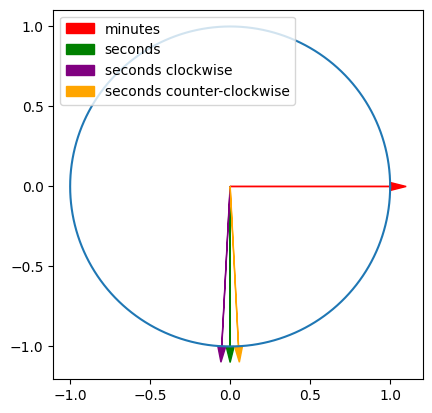

In [54]:
# Question 8

def time_to_complex(in_time):
    minutes, seconds = in_time.split(':')
    minutes = int(minutes)
    seconds = int(seconds)
    minute_angle = 2 * np.pi * (minutes / 60)
    second_angle = 2 * np.pi * (seconds / 60)
    minute_hand = np.sin(minute_angle) + 1j * np.cos(minute_angle)
    second_hand = np.sin(second_angle) + 1j * np.cos(second_angle)
    return minute_hand, second_hand

cw_rotation = np.exp(-1j * np.pi / 60)
ccw_rotation = np.exp(1j * np.pi / 60)
mins, secs = time_to_complex('15:30')
sec_cw = secs*cw_rotation
sec_ccw = secs*ccw_rotation
# drew circle from techniques here: https://stackoverflow.com/questions/32092899/plot-equation-showing-a-circle
num_pts=360
ps = np.arange(num_pts+1)
pts = np.exp(2j*np.pi/num_pts *(ps))

fig, ax = plt.subplots(1)
ax.plot(pts.real, pts.imag)
ax.arrow(0, 0, mins.real, mins.imag, head_width=0.05, head_length=0.1, color='red', label='minutes')
ax.arrow(0, 0, secs.real, secs.imag, head_width=0.05, head_length=0.1, color='green', label='seconds')
ax.arrow(0, 0, sec_cw.real, sec_cw.imag, head_width=0.05, head_length=0.1, color='purple', label='seconds clockwise')
ax.arrow(0, 0, sec_ccw.real, sec_ccw.imag, head_width=0.05, head_length=0.1, color='orange', label='seconds counter-clockwise')

ax.set_aspect(1)
plt.legend(loc='upper left')
plt.show()



# Question 10

I chose to do question 10 for the drum machine. I got samples from https://freewavesamples.com/ and used techniques learned in the mir course to make a beat_creator function for adding different drum patterns and samples into a beat sequence.

In [55]:
# Question 10
# Used techniques/code from https://github.com/gtzan/teaching_mir/blob/main/notebooks/csc475_beat_sequencer.ipynb

def beat_creator(sound, beat_sig, drum_pattern, sixteenth):
    for i, val in enumerate(drum_pattern):
        if val == 1:
            length = min(len(sound), len(beat_sig) - sixteenth*i)
            beat_sig[sixteenth*i:(sixteenth*i) + length] = sound[:length]
    return beat_sig


srate = 44100
# Had to make samples go from stereo to mono
kick, _ = sf.read('./audio/kick.wav')
kick = kick[:,0]
snare, _ = sf.read('./audio/snare.wav')
snare = snare[:,0]
hat, _ = sf.read('./audio/hihat.wav')
hat = hat[:,0]

bpm = 80 
bps = bpm / 60 

beats_per_bar = 4
num_bars = 2

quarter_len_samples = int(srate / bps)
sixteenth = int(quarter_len_samples / 4)

# Create a kick pattern
kick_pattern = [1,0,0,0,
                1,0,0,0,
                1,0,0,0,
                1,0,0,1,
                1,0,0,1,
                0,0,1,0,
                1,0,0,1,
                0,0,1,0]

# Create a snare pattern
snare_pattern = [0,0,0,0,
                 1,0,0,0,
                 0,0,0,0,
                 1,0,0,0,
                 0,0,0,0,
                 1,0,0,0,
                 0,0,0,0,
                 1,0,0,0]

# Create a hihat pattern in sixteenth notes
hihat_pattern = [0,0,1,0,
                 0,0,1,0,
                 0,0,1,0,
                 0,0,1,0,
                 1,1,1,1,
                 1,0,1,0,
                 0,0,1,0,
                 1,0,1,0]

beat_signal = np.zeros(quarter_len_samples * beats_per_bar * num_bars)
beat_signal = beat_creator(kick, beat_signal, kick_pattern, sixteenth)
beat_signal = beat_creator(snare, beat_signal, snare_pattern, sixteenth)
beat_signal = beat_creator(hat, beat_signal, hihat_pattern, sixteenth)


ipd.Audio(beat_signal, rate=srate)

# Question 12

For this question I read about and used the FamiTracker chiptune software

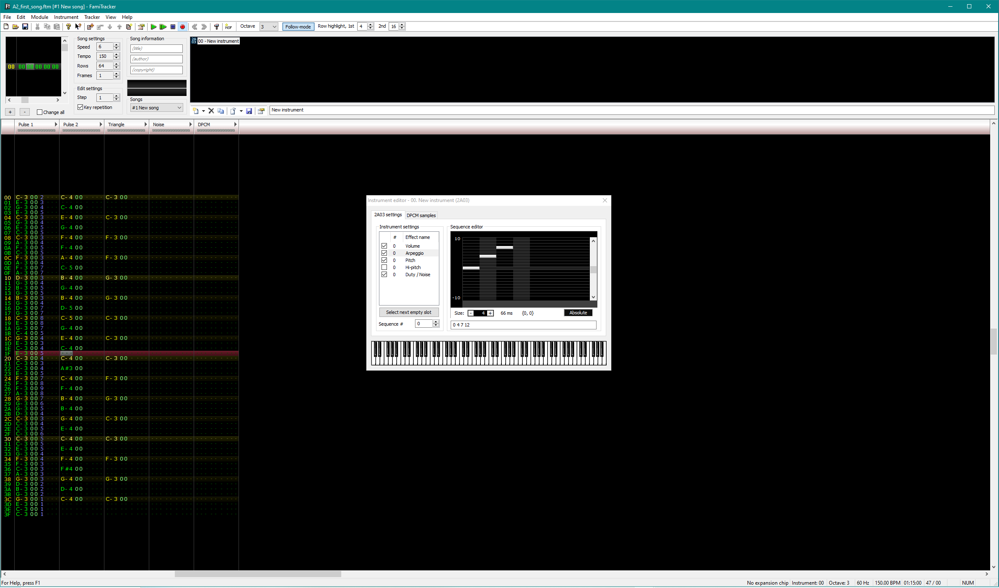

In [45]:
# Question 12

from IPython import display
display.Image("FamiTracker.PNG")